In [1]:
import numpy as np
import dask
import dask.array as da
import matplotlib.pyplot as plt
import time
from datetime import timedelta

In [2]:
from dask.distributed import Client
#client = Client("10.0.0.4:8786")
client = Client()
client

Client Scheduler: tcp://127.0.0.1:51523 Dashboard: http://127.0.0.1:8787/status,Cluster Workers: 4 Cores: 12 Memory: 16.99 GB


# Theoretical Background

The Hamiltonian of the system:

$$ H = \frac{1}{2}\sum^{N}_{i}m_i{v_i}^2 + \frac{1}{2}K\sum^{N}_{i}(x_{i+1}-{x_i})^2 + \frac{1}{4}G\sum^{N}_{i}(x_{i+1}-{x_i})^4 + \frac{1}{2}k\sum^{N}_{i}{x_i}^2 + \frac{1}{4}g\sum^{N}_{i}{x_i}^4$$

The first term is Kinetic energy and the remaining 4 the Potential energy.

The acceleration of the particles is found as:

$$ a_i = -\frac{1}{m_i}\frac{\partial U}{\partial x_i} $$

And therefore:

$$ a_i = \frac{K}{m_i}(x_{i+1} - 2x_i +x_{i-1}) + \frac{G}{m_i}[(x_{i+1} - x_i)^3 - (x_{i} - x_{i-1})^3]) - \frac{k}{m_i}x_i - \frac{g}{m_i}{x_i}^3 $$

The $Verler$ algorithm works in this order:

    1. Initialize positions and velocities

    2. Calculate the accelerations given the Potential

    3. Update the positions using the Taylor expansion:

$$ x_i(t+δt) = x_i(t) +v_i(t)δt + \frac{1}{2}a[x_i(t)](δt)^2 + \cdots$$

    4. Update the velocities using the mean acceleration of the old and new positions in the expansion:
    
$$ v_i(t+δt) = v_i(t) + \frac{a[x_i(t)] + a[x_i(t+δt)]}{2}δt + \cdots $$

    5. Accept the new positions
    
    6. Calculcate all statistical measures of interest
    
    7. Loop from 2.
    
For the calculation of the potential energy and the kinetic energy the formulas are trivial.

$$ \bar{K} = \frac{1}{2}m\bar{v^2} $$

For the calculation of the Temperature we are using the Kinetic energy of the particles since:

$$ \bar{K} =\frac{1}{2}m\bar{v^2}= \frac{1}{2}mNk_b\bar{T} \rightarrow \bar{T} = \frac{\bar{v^2}}{Nk_b} $$

For the calculation of the Pressure:

$$ P = \frac{1}{3}Nm\bar{v^2} $$

In [3]:
#Constants and other global variables:
#Mass of a heavy molecule lets say water = 2.989e−26 #kg
mass = 1
#Potential
K = 5
G = 3
k = 1
g = 2

#Boltzmann constant = 1.38064852e-23
k_B = 1

#Position initialization
num_particles = 6*10**(7)
print("Number of particles:",num_particles)
box_len = 10**(0)
print("Length of the box",box_len)
#Set chunks
chunks = 4

Number of particles: 60000000
Length of the box 1


# The Idea
Parallelize acceleration, position, velocity and (some) statistical quantities computations, by using dask.arrays .

Accelerations, positions and velocities will be calculated in chunks that get maped on the available resources of the cluster while mean values will be reduce operations which use positions and velocities to compute only one number, eg. Kinetic/Potential energy, mean system velocity, RMS velocity, Temperature and Pressure. 

Init positions as uniformly random inside the box lenght (mean at zero, but it doesn't matter)

In [4]:
#Init positions as random around the grid constant.
positions = np.random.uniform(low=-box_len/2, high=box_len/2, size=num_particles)
positions = da.from_array(positions,int(num_particles/chunks))
positions

dask.array<array, shape=(60000000,), dtype=float64, chunksize=(15000000,), chunktype=numpy.ndarray>

To impose periodic boundary conditions I perform a transpose of 1 position to the left and to the right.

In [77]:
x_p1 , x_m1 = np.roll(positions,1) , np.roll(positions,-1)

Init velocities as a gaussian distribution of std depending on the temperature.
Here I initialize with temperature 2000 (units)

In [5]:
#Init velocities from normal Distribution.
temp = 272
sigma = ((k_B*temp*mass))**0.5
velocities = np.random.normal(loc=0, scale=sigma, size=(num_particles))
velocities = da.from_array(velocities,int(num_particles/chunks))
velocities

dask.array<array, shape=(60000000,), dtype=float64, chunksize=(15000000,), chunktype=numpy.ndarray>

## How the acceleration function works

In [6]:
def acceleration(x_m1,x,x_p1):
    return ( K*(x_p1 - 2*x + x_m1) + G*((x_p1-x)**3 -(x-x_m1)**3) - k*x - g*x**3 ) / mass

Instead of a for loop parsing each particle we can vectorize the accelerations computations with np.roll, which transposes the whole vector, thus we obtain two things:
1. Naturally occuring periodic conditions since if we roll by 1 position to the right, eg. np.roll(x,1) the last element becomes first.
2. We vectorise computations since the operation $x_{rolled} - x$ returns a vector containing the operation on each element. 

## All other functions are trivial
Exactly as mentioned on the theory above

In [7]:
def positions_new(x,v,a_old,dt):
    return ( x + v*dt + 0.5*a_old*(dt**2) )

In [8]:
def velocity(v,a_old,a_new,dt):
    return v + 0.5*(a_old + a_new)*dt

In [9]:
def potential_energy(x):
    x_p1 = np.roll(x,1)
    return np.sum((1/2)*K*(x_p1 - x)**2 + (1/4)*G*(x_p1 - x)**4 + (1/2)*k*x**2 + (1/4)*g*x**4)

# Just visualizing the DAGs
Beautiful and scary at the same time

### Disclaimer: in the actual simulation I use .persist( ) after every function call

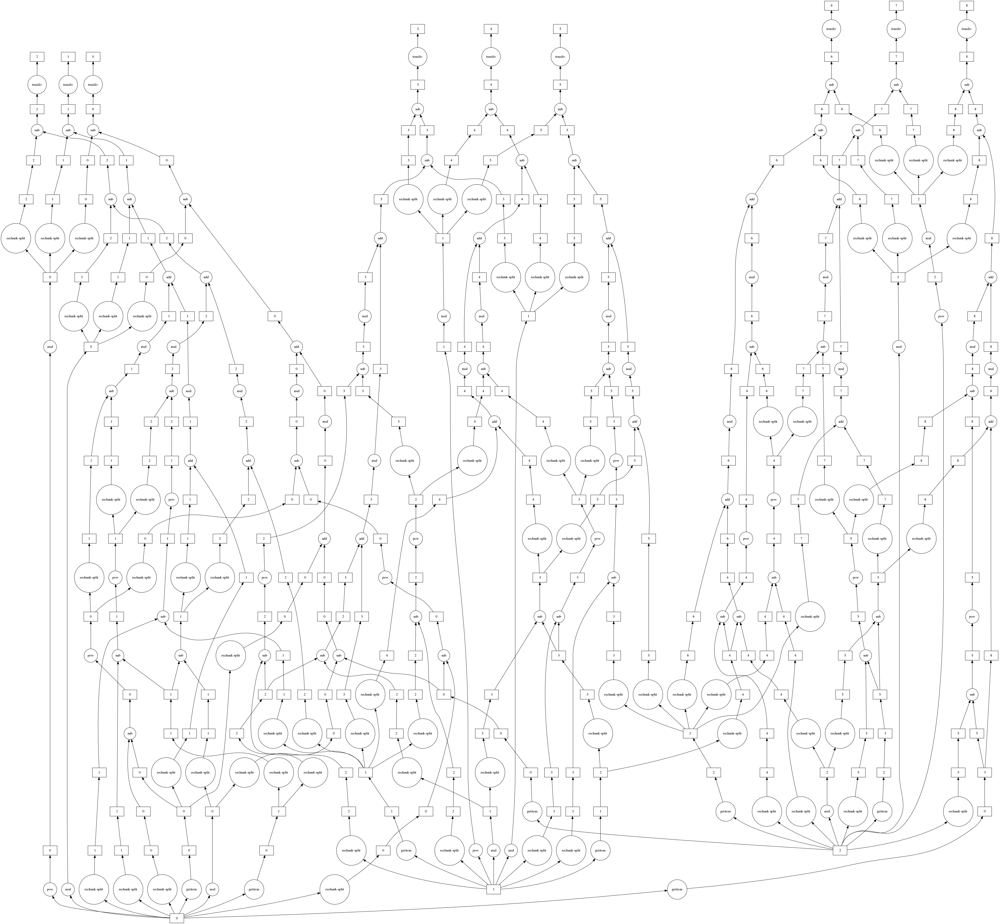

In [11]:
acceleration_old = acceleration(x_m1,positions,x_p1)
acceleration_old.visualize()

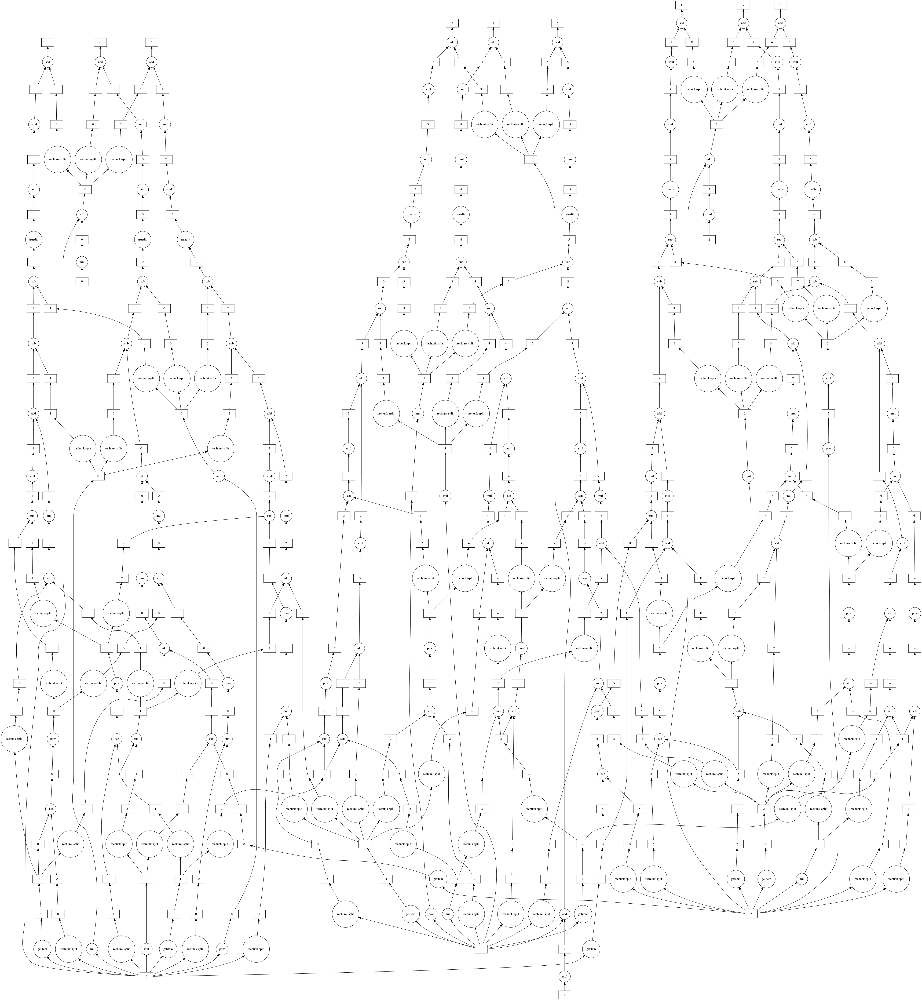

In [12]:
x_new = positions_new(positions,velocities,acceleration_old,0.01)
x_new.visualize()

In [13]:
x_p1 , x_m1 = np.roll(positions,1) , np.roll(positions,-1)
acceleration_new = acceleration(x_m1,x_new,x_p1)
acceleration_new.visualize()

In [14]:
velocities = velocity(velocities,acceleration_old,acceleration_new,0.01)
velocities.visualize()

# Run the simulation

In [10]:
#Number of Iterations
N = 10

#Order of time discritization (it has to be at least 2nd order)
dt = 0.01

#Time keeping happening here
clock = 0
dt_clock = 0

#Data lists
Potential_s, Kinetic_s = [], []
Temperature_s, mean_Temperature = [], []
Pressure_s, mean_Pressure = [], []
mean_velocity, mean_velocity_squared = [], []

#Initializing the time loop
for t in np.arange(N):
    start_time = time.monotonic()
    #cacl mean Velocity of the system
    mean_velocity.append(np.mean(velocities).compute())
    mean_velocity_squared.append(np.mean(velocities**2).compute())

    #calc Kinetic and Potential energy
    Potential_s.append(potential_energy(positions).compute())
    Kinetic_s.append((1/2)*mass*num_particles*mean_velocity_squared[-1])

    #calc Temperature and mean Temperature
    Temperature_s.append((mass/k_B)*mean_velocity_squared[-1])
    mean_Temperature.append(np.mean(Temperature_s))
    
    #calc Pressure and mean Pressure
    Pressure_s.append((1/(3*box_len))*num_particles*mass*mean_velocity_squared[-1])
    mean_Pressure.append(np.mean(Pressure_s))
    
    #Integration of the Verlet algorithm
    #1.1 Do the rolls
    x_p1 , x_m1 = np.roll(positions,1) , np.roll(positions,-1)
    #1.2 Compute Accelerations
    acceleration_old = acceleration(x_m1,positions,x_p1).rechunk(int(num_particles/chunks)).persist()
    
    #2 Compute new positions
    x_new = positions_new(positions,velocities,acceleration_old,dt).persist()
    
    #3.1 Need to compute the rolls again for the new positions
    x_p1 , x_m1 = np.roll(x_new,1) , np.roll(x_new,-1)
    #3.2 Compute the new accelerations
    acceleration_new = acceleration(x_m1,x_new,x_p1).rechunk(int(num_particles/chunks)).persist()
    
    #4 Update the velocities
    velocities = velocity(velocities,acceleration_old,acceleration_new,0.01).rechunk(int(num_particles/chunks)).persist()

    #5 Update the new positions / also rechuncking
    positions = x_new
    
    #Some time keeping happening here
    end_time = time.monotonic()
    clock += end_time-start_time
    dt_clock += dt
    
    print("Iteration",t+1," | Simulation Clock:",round(dt_clock,2),"s | System Clock",round(clock,3),"s")

Iteration 1  | Simulation Clock: 0.01 s | System Clock 8.188 s
Iteration 2  | Simulation Clock: 0.02 s | System Clock 20.594 s
Iteration 3  | Simulation Clock: 0.03 s | System Clock 25.594 s
Iteration 4  | Simulation Clock: 0.04 s | System Clock 30.703 s
Iteration 5  | Simulation Clock: 0.05 s | System Clock 35.578 s
Iteration 6  | Simulation Clock: 0.06 s | System Clock 40.594 s
Iteration 7  | Simulation Clock: 0.07 s | System Clock 45.688 s
Iteration 8  | Simulation Clock: 0.08 s | System Clock 50.845 s
Iteration 9  | Simulation Clock: 0.09 s | System Clock 55.97 s
Iteration 10  | Simulation Clock: 0.1 s | System Clock 61.313 s


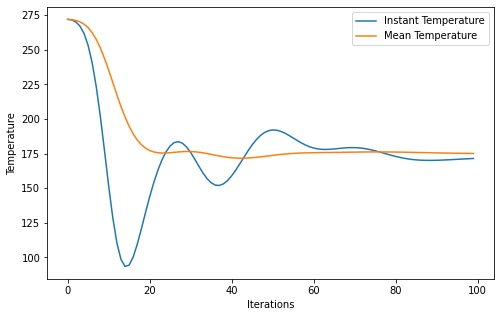

In [70]:
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(Temperature_s,label='Instant Temperature')
ax.plot(mean_Temperature,label='Mean Temperature')
ax.set_xlabel('Iterations')
ax.set_ylabel('Temperature')
ax.legend()
plt.show()

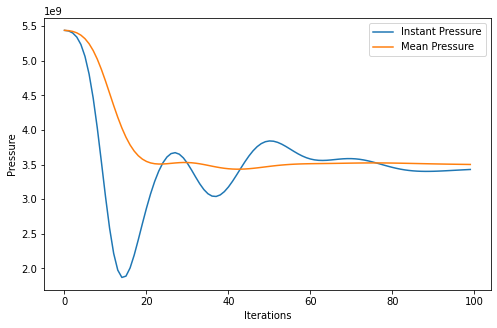

In [71]:
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(Pressure_s,label='Instant Pressure')
ax.plot(mean_Pressure,label='Mean Pressure')
ax.set_xlabel('Iterations')
ax.set_ylabel('Pressure')
ax.legend()
plt.show()

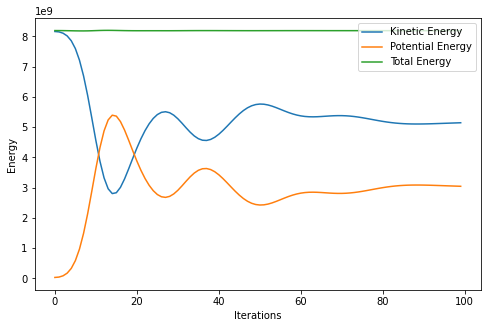

In [72]:
from operator import add
Total_Energy = list( map(add, Kinetic_s, Potential_s) )
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(Kinetic_s,label="Kinetic Energy")
ax.plot(Potential_s,label="Potential Energy")
ax.plot(Total_Energy,label="Total Energy")
ax.set_xlabel('Iterations')
ax.set_ylabel('Energy')
ax.legend(loc="upper right")
plt.show()

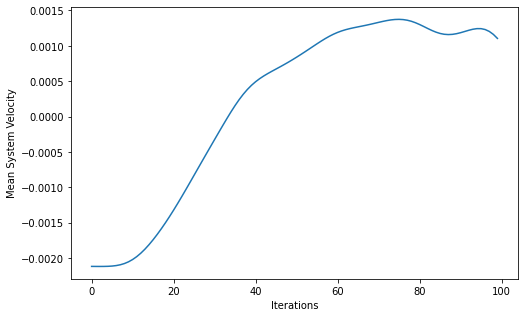

In [73]:
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(mean_velocity)
ax.set_xlabel('Iterations')
ax.set_ylabel('Mean System Velocity')
plt.show()

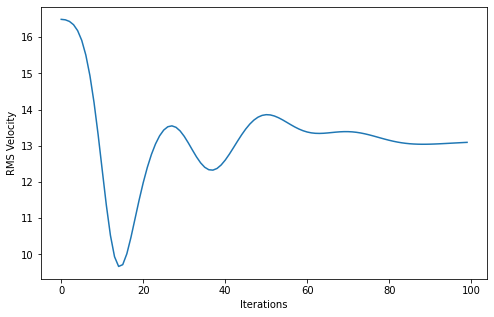

In [74]:
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(np.sqrt(mean_velocity_squared))
ax.set_xlabel('Iterations')
ax.set_ylabel('RMS Velocity')
plt.show()

## I want to search the parameter space of scaling the grid and the chunks with respect to mean Computation Time (for an epoch) / chunk

In [8]:
#Mass of a heavy molecule lets say water = 2.989e−26 #kg
mass = 1
#Potential
K = 5
G = 3
k = 1
g = 2

#Boltzmann constant = 1.38064852e-23
k_B = 1

box_len = 10**(0)

search_chunks = [1,2,3,6,9,12]
search_num_particles = [10**5,3*10**5,6*10**5,10**6]
results = []

dt = 0.01

clock = 0
c = 0
tot = len(search_chunks)*len(search_num_particles)

#Number of Iterations
T = 5
for num_particles in search_num_particles:
    for chunks in search_chunks:
        #Init positions as random around the grid constant.
        positions = np.random.uniform(low=-box_len, high=box_len, size=num_particles)
        positions = da.from_array(positions,int(num_particles/chunks))
        
        #Init velocities from normal Distribution.
        temp = 500
        sigma = ((k_B*temp*mass))**0.5
        velocities = np.random.normal(loc=0, scale=sigma, size=(num_particles))
        velocities = da.from_array(velocities,int(num_particles/chunks))

        #Time keeping happening here
        clock = 0
        dt_clock = 0

        #Data lists
        Potential_s, Kinetic_s = [], []
        Temperature_s, mean_Temperature = [], []
        Pressure_s, mean_Pressure = [], []
        mean_velocity, mean_velocity_squared = [], []

        #Initializing the time loop
        for t in np.arange(T):
            start_time = time.monotonic()
            #cacl mean Velocity of the system
            mean_velocity.append(np.mean(velocities).compute())
            mean_velocity_squared.append(np.mean(velocities**2).compute())

            #calc Kinetic and Potential energy
            Potential_s.append(potential_energy(positions).compute())
            Kinetic_s.append((1/2)*mass*num_particles*mean_velocity_squared[-1])

            #calc Temperature and mean Temperature
            Temperature_s.append((mass/k_B)*mean_velocity_squared[-1])
            mean_Temperature.append(np.mean(Temperature_s))

            #calc Pressure and mean Pressure
            Pressure_s.append((1/(3*box_len))*num_particles*mass*mean_velocity_squared[-1])
            mean_Pressure.append(np.mean(Pressure_s))

            #Integration of the Verlet algorithm
            #1.1 Do the rolls
            x_p1 , x_m1 = np.roll(positions,1) , np.roll(positions,-1)
            #1.2 Compute Accelerations
            acceleration_old = acceleration(x_m1,positions,x_p1).rechunk(int(num_particles/chunks)).persist()

            #2 Compute new positions
            x_new = positions_new(positions,velocities,acceleration_old,dt).persist()

            #3.1 Need to compute the rolls again for the new positions
            x_p1 , x_m1 = np.roll(x_new,1) , np.roll(x_new,-1)
            #3.2 Compute the new accelerations
            acceleration_new = acceleration(x_m1,x_new,x_p1).rechunk(int(num_particles/chunks)).persist()

            #4 Update the velocities
            velocities = velocity(velocities,acceleration_old,acceleration_new,0.01).rechunk(int(num_particles/chunks)).persist()

            #5 Update the new positions / also rechuncking
            positions = x_new

            #Some time keeping happening here
            end_time = time.monotonic()
            clock += end_time-start_time
            dt_clock += dt

        #Some time keeping happening here    
        end_time = time.monotonic()
        clock = end_time-start_time
        c += 1
        print("Iteration",c,"/",tot," | Iteration Time",round(clock,3),"s")

        results.append([num_particles,chunks,clock/T])

Iteration 1 / 24  | Iteration Time 0.964 s
Iteration 2 / 24  | Iteration Time 1.01 s
Iteration 3 / 24  | Iteration Time 1.414 s
Iteration 4 / 24  | Iteration Time 1.828 s
Iteration 5 / 24  | Iteration Time 2.374 s
Iteration 6 / 24  | Iteration Time 2.952 s
Iteration 7 / 24  | Iteration Time 1.003 s
Iteration 8 / 24  | Iteration Time 1.034 s
Iteration 9 / 24  | Iteration Time 1.184 s
Iteration 10 / 24  | Iteration Time 1.884 s
Iteration 11 / 24  | Iteration Time 2.378 s
Iteration 12 / 24  | Iteration Time 2.907 s
Iteration 13 / 24  | Iteration Time 1.277 s
Iteration 14 / 24  | Iteration Time 1.125 s
Iteration 15 / 24  | Iteration Time 1.484 s
Iteration 16 / 24  | Iteration Time 1.832 s
Iteration 17 / 24  | Iteration Time 2.527 s
Iteration 18 / 24  | Iteration Time 3.199 s
Iteration 19 / 24  | Iteration Time 1.814 s
Iteration 20 / 24  | Iteration Time 1.559 s
Iteration 21 / 24  | Iteration Time 1.595 s
Iteration 22 / 24  | Iteration Time 2.113 s
Iteration 23 / 24  | Iteration Time 2.318 

In [9]:
results = np.array(results)
results

array([[1.00000000e+05, 1.00000000e+00, 1.92753875e-01],
       [1.00000000e+05, 2.00000000e+00, 2.01927687e-01],
       [1.00000000e+05, 3.00000000e+00, 2.82850594e-01],
       [1.00000000e+05, 6.00000000e+00, 3.65623083e-01],
       [1.00000000e+05, 9.00000000e+00, 4.74827885e-01],
       [1.00000000e+05, 1.20000000e+01, 5.90399229e-01],
       [3.00000000e+05, 1.00000000e+00, 2.00625313e-01],
       [3.00000000e+05, 2.00000000e+00, 2.06778146e-01],
       [3.00000000e+05, 3.00000000e+00, 2.36897042e-01],
       [3.00000000e+05, 6.00000000e+00, 3.76767281e-01],
       [3.00000000e+05, 9.00000000e+00, 4.75549781e-01],
       [3.00000000e+05, 1.20000000e+01, 5.81361083e-01],
       [6.00000000e+05, 1.00000000e+00, 2.55453646e-01],
       [6.00000000e+05, 2.00000000e+00, 2.25023562e-01],
       [6.00000000e+05, 3.00000000e+00, 2.96867646e-01],
       [6.00000000e+05, 6.00000000e+00, 3.66492062e-01],
       [6.00000000e+05, 9.00000000e+00, 5.05304260e-01],
       [6.00000000e+05, 1.20000

## I tried to do some visualizations on the dependence between computation time / chunks / num of particles.
but its 23.34 and I'm running out of time. It is what it is.

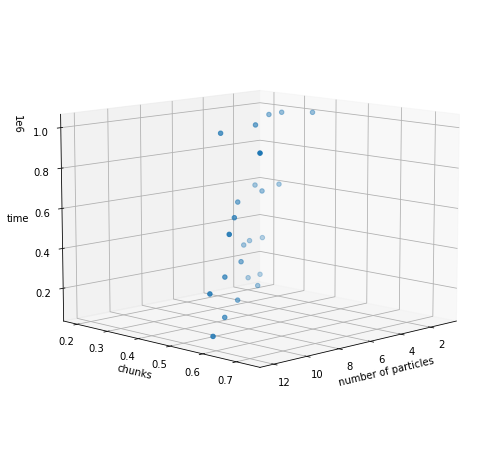

In [14]:
from mpl_toolkits import mplot3d

x = results[:,1]
y = results[:,2]
z = results[:,0]

fig = plt.figure(figsize=(10,8))
ax = plt.axes(projection='3d')
ax.scatter3D(x,y,z)
ax.set_xlabel('number of particles')
ax.set_ylabel('chunks')
ax.set_zlabel("time")
ax.view_init(10,45)

Run without DASK

In [24]:
#Constants and other global variables:
mass = 1
#Potential
K = 5
G = 3
k = 1
g = 2

#Boltzmann constant = 1.38064852e-23
k_B = 1

#Position initialization
num_particles = 6*10**(7)
print("Number of particles:",num_particles)
box_len = 10**(0)
print("Length of the box",box_len)

#Number of Iterations
N = 10

#Order of time discritization (it has to be at least 2nd order)
dt = 0.01

#Time keeping happening here
clock = 0
dt_clock = 0

#Init positions as random around the grid constant.
positions = np.random.uniform(low=-box_len, high=box_len, size=num_particles)

#Init velocities from normal Distribution.
temp = 500
sigma = ((k_B*temp*mass))**0.5
velocities = np.random.normal(loc=0, scale=sigma, size=(num_particles))

#Data lists
Potential_s, Kinetic_s = [], []
Temperature_s, mean_Temperature = [], []
Pressure_s, mean_Pressure = [], []
mean_velocity, mean_velocity_squared = [], []

#Initializing the time loop
for t in np.arange(N):
    start_time = time.monotonic()
    #cacl mean Velocity of the system
    mean_velocity.append(np.mean(velocities))
    mean_velocity_squared.append(np.mean(velocities**2))

    #calc Kinetic and Potential energy
    Potential_s.append(potential_energy(positions))
    Kinetic_s.append((1/2)*mass*num_particles*mean_velocity_squared[-1])

    #calc Temperature and mean Temperature
    Temperature_s.append((mass/k_B)*mean_velocity_squared[-1])
    mean_Temperature.append(np.mean(Temperature_s))
    
    #calc Pressure and mean Pressure
    Pressure_s.append((1/(3*box_len))*num_particles*mass*mean_velocity_squared[-1])
    mean_Pressure.append(np.mean(Pressure_s))
    
    #Integration of the Verlet algorithm
    #1.1 Do the rolls
    x_p1 , x_m1 = np.roll(positions,1) , np.roll(positions,-1)
    #1.2 Compute Accelerations
    acceleration_old = acceleration(x_m1,positions,x_p1)
    
    #2 Compute new positions
    x_new = positions_new(positions,velocities,acceleration_old,dt)
    
    #3.1 Need to compute the rolls again for the new positions
    x_p1 , x_m1 = np.roll(x_new,1) , np.roll(x_new,-1)
    #3.2 Compute the new accelerations
    acceleration_new = acceleration(x_m1,x_new,x_p1)
    
    #4 Update the velocities
    velocities = velocity(velocities,acceleration_old,acceleration_new,0.01)

    #5 Update the new positions / also rechuncking
    positions = x_new
    
    #Some time keeping happening here
    end_time = time.monotonic()
    clock += end_time-start_time
    dt_clock += dt
    
    print("Iteration",t+1," | Simulation Clock:",round(dt_clock,2),"s | System Clock",round(clock,3),"s")

Number of particles: 60000000
Length of the box 1
Iteration 1  | Simulation Clock: 0.01 s | System Clock 21.953 s
Iteration 2  | Simulation Clock: 0.02 s | System Clock 43.312 s
Iteration 3  | Simulation Clock: 0.03 s | System Clock 64.765 s
Iteration 4  | Simulation Clock: 0.04 s | System Clock 86.094 s
Iteration 5  | Simulation Clock: 0.05 s | System Clock 107.422 s
Iteration 6  | Simulation Clock: 0.06 s | System Clock 128.766 s
Iteration 7  | Simulation Clock: 0.07 s | System Clock 150.094 s
Iteration 8  | Simulation Clock: 0.08 s | System Clock 171.454 s
Iteration 9  | Simulation Clock: 0.09 s | System Clock 192.875 s
Iteration 10  | Simulation Clock: 0.1 s | System Clock 214.375 s


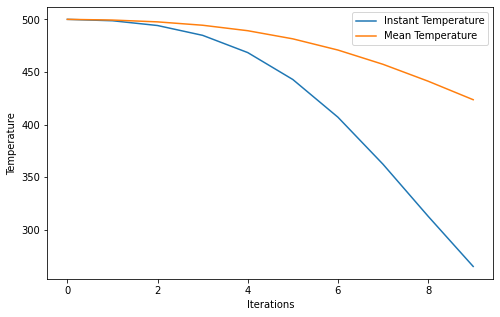

In [25]:
fig, ax = plt.subplots(figsize=(8,5))
ax.plot(Temperature_s,label='Instant Temperature')
ax.plot(mean_Temperature,label='Mean Temperature')
ax.set_xlabel('Iterations')
ax.set_ylabel('Temperature')
ax.legend()
plt.show()